In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point

In [2]:
expnames=['T63L26_CNTRLJJA','T63L26_Cluster2','T63L26_ANA','T63L26_ANASE']#,'T63L26_Cluster2NASH','T63L26_Cluster4','T63L26_Cluster4NASH'
basepath='/data/esplab/kpegion/projects/AGCM/AnnualCycle/'
basepath='/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/'
DataSetname = ['uvel','vvel','geo']
Dataname = ['u','v','geo']

In [3]:
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc


/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/scipy/__init__.py:132: UserWarning: A NumPy version >=1.21.6 and <1.28.0 is required for this version of SciPy (detected version 1.21.5)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63

In [4]:
ds_exps

<xarray.Dataset>
Dimensions:  (exp: 4, time: 720, lev: 4, lat: 96, lon: 192)
Coordinates:
  * time     (time) datetime64[ns] 1950-01-01 1950-01-02 ... 1951-12-21
  * lev      (lev) float64 850.0 500.0 300.0 200.0
  * lat      (lat) float64 88.57 86.72 84.86 83.0 ... -83.0 -84.86 -86.72 -88.57
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * exp      (exp) <U15 'T63L26_CNTRLJJA' 'T63L26_Cluster2' ... 'T63L26_ANASE'
Data variables:
    u        (exp, time, lev, lat, lon) float64 dask.array<chunksize=(1, 720, 4, 96, 192), meta=np.ndarray>
    v        (exp, time, lev, lat, lon) float64 dask.array<chunksize=(1, 720, 4, 96, 192), meta=np.ndarray>
    geo      (exp, time, lev, lat, lon) float64 dask.array<chunksize=(1, 720, 4, 96, 192), meta=np.ndarray>

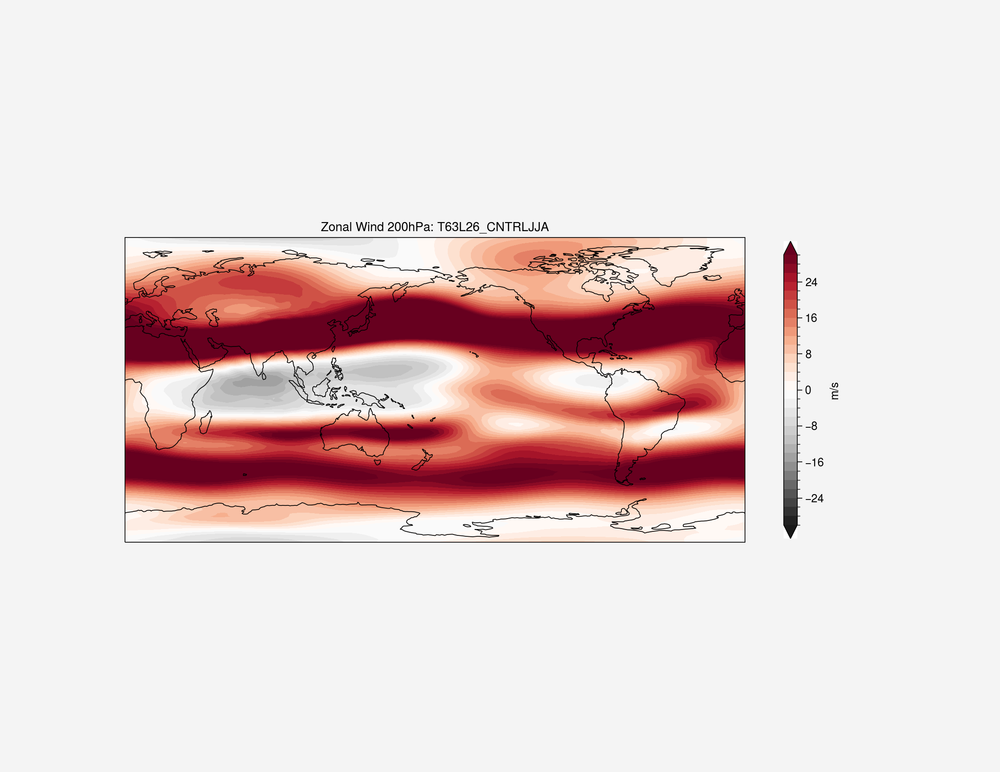

In [5]:
exp='T63L26_CNTRLJJA'
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data=ds_exps['u'].sel(lev=200,exp=exp).mean(dim='time')
data, lons = add_cyclic_point(data, coord=ds_exps['lon'])
cs=ax.contourf(lons, ds_exps['lat'],data,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-30,31,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: '+exp)
plt.colorbar(cs,shrink=0.5,label='m/s')

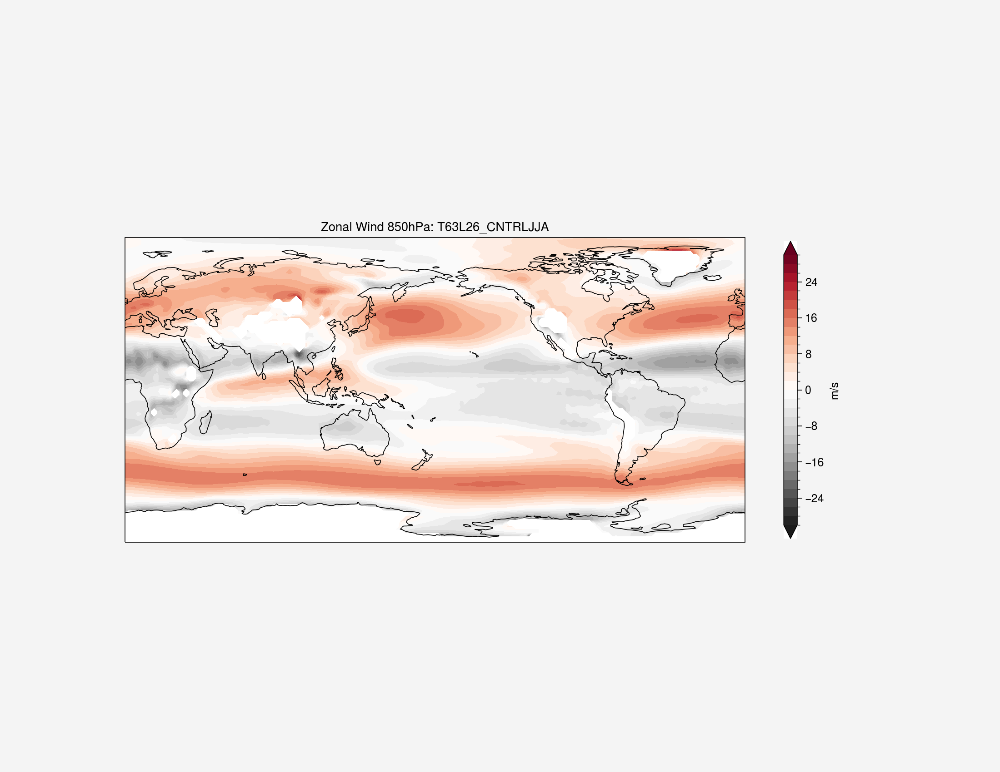

In [6]:
exp='T63L26_CNTRLJJA'
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data=ds_exps['u'].sel(lev=850.0,exp=exp).mean(dim='time')
data, lons = add_cyclic_point(data, coord=ds_exps['lon'])
cs=ax.contourf(lons, ds_exps['lat'],data,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-30,31,2))
ax.coastlines()
plt.title('Zonal Wind 850hPa: '+exp)
plt.colorbar(cs,shrink=0.5,label='m/s')

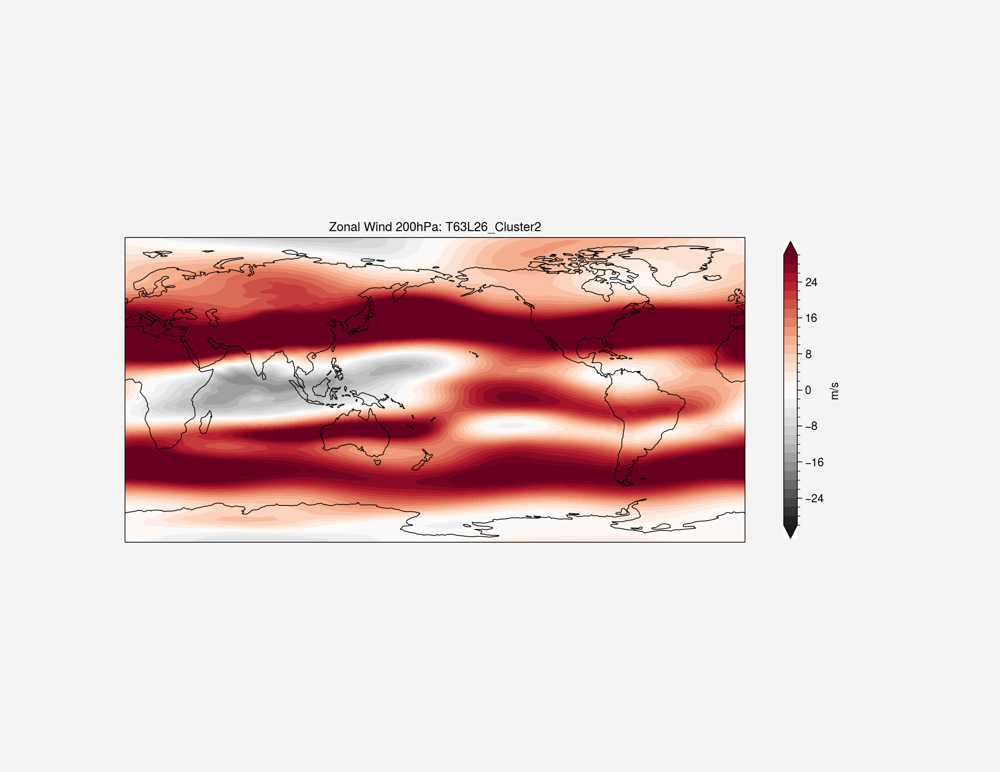

In [7]:
exp='T63L26_Cluster2'
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data=ds_exps['u'].sel(lev=200,exp=exp).mean(dim='time')
data, lons = add_cyclic_point(data, coord=ds_exps['lon'])
cs=ax.contourf(lons, ds_exps['lat'],data,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-30,31,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: '+exp)
plt.colorbar(cs,shrink=0.5,label='m/s')

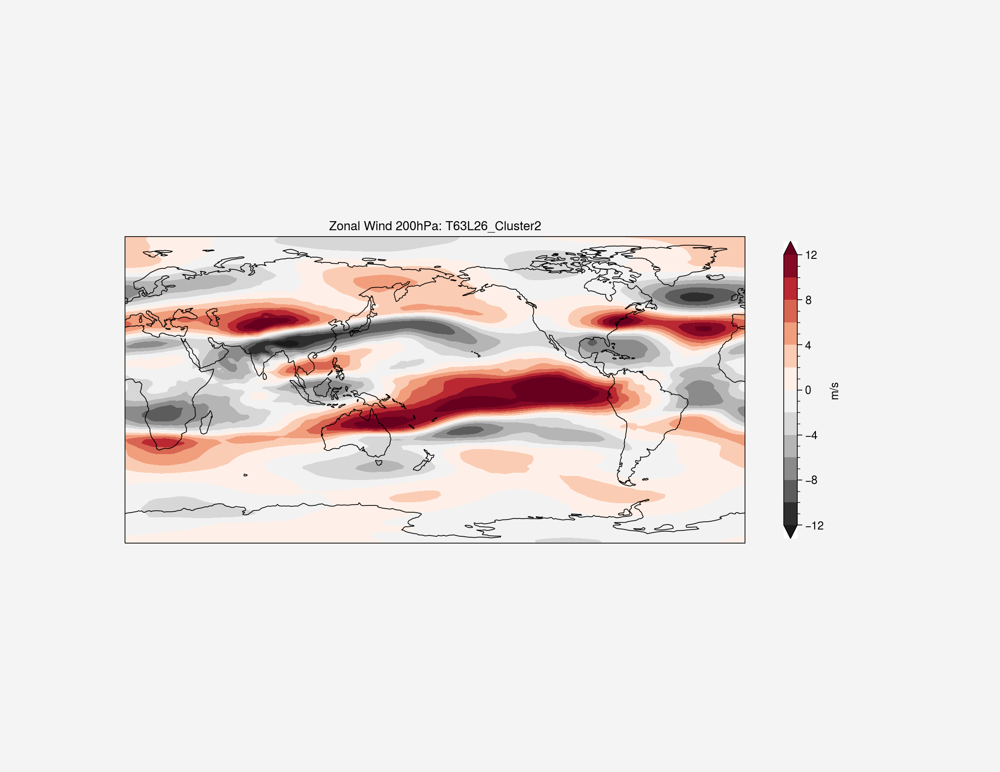

In [8]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['u'].sel(lev=200,exp='T63L26_CNTRLJJA').mean(dim='time')
data2=ds_exps['u'].sel(lev=200,exp='T63L26_Cluster2').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-12,13,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: '+exp)
plt.colorbar(cs,shrink=0.5,label='m/s')

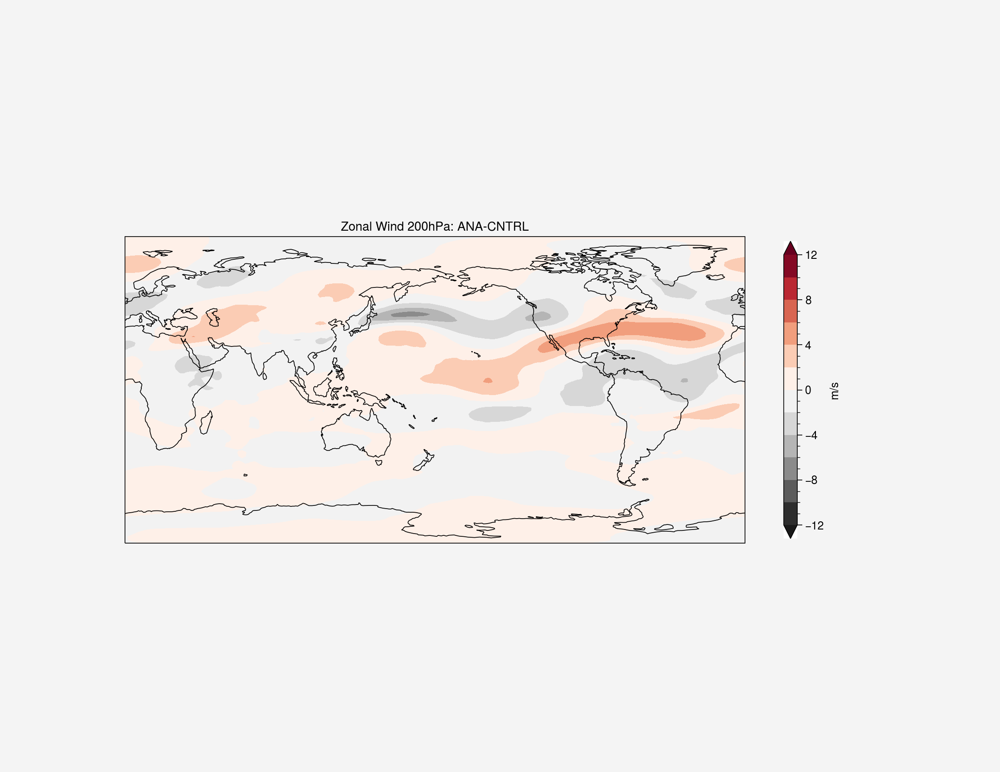

In [9]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['u'].sel(lev=200,exp='T63L26_CNTRLJJA').mean(dim='time')
data2=ds_exps['u'].sel(lev=200,exp='T63L26_ANA').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-12,13,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: ANA-CNTRL')
plt.colorbar(cs,shrink=0.5,label='m/s')

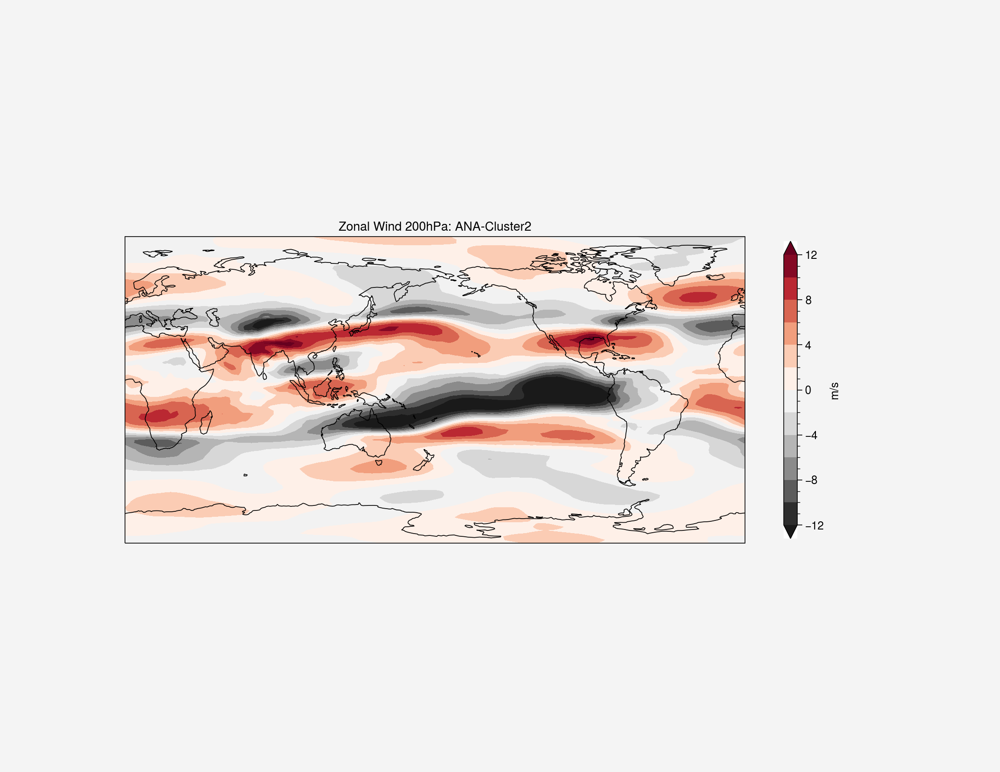

In [10]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['u'].sel(lev=200,exp='T63L26_Cluster2').mean(dim='time')
data2=ds_exps['u'].sel(lev=200,exp='T63L26_ANA').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-12,13,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: ANA-Cluster2')
plt.colorbar(cs,shrink=0.5,label='m/s')

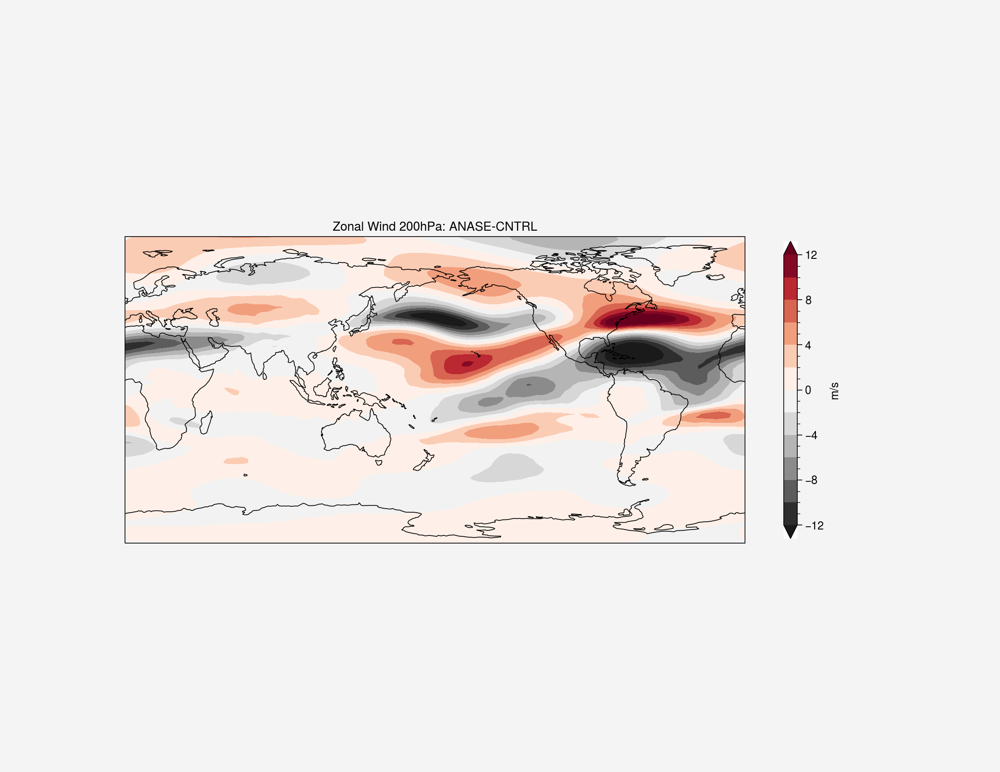

In [11]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['u'].sel(lev=200,exp='T63L26_CNTRLJJA').mean(dim='time')
data2=ds_exps['u'].sel(lev=200,exp='T63L26_ANASE').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-12,13,2))
ax.coastlines()
plt.title('Zonal Wind 200hPa: ANASE-CNTRL')
plt.colorbar(cs,shrink=0.5,label='m/s')

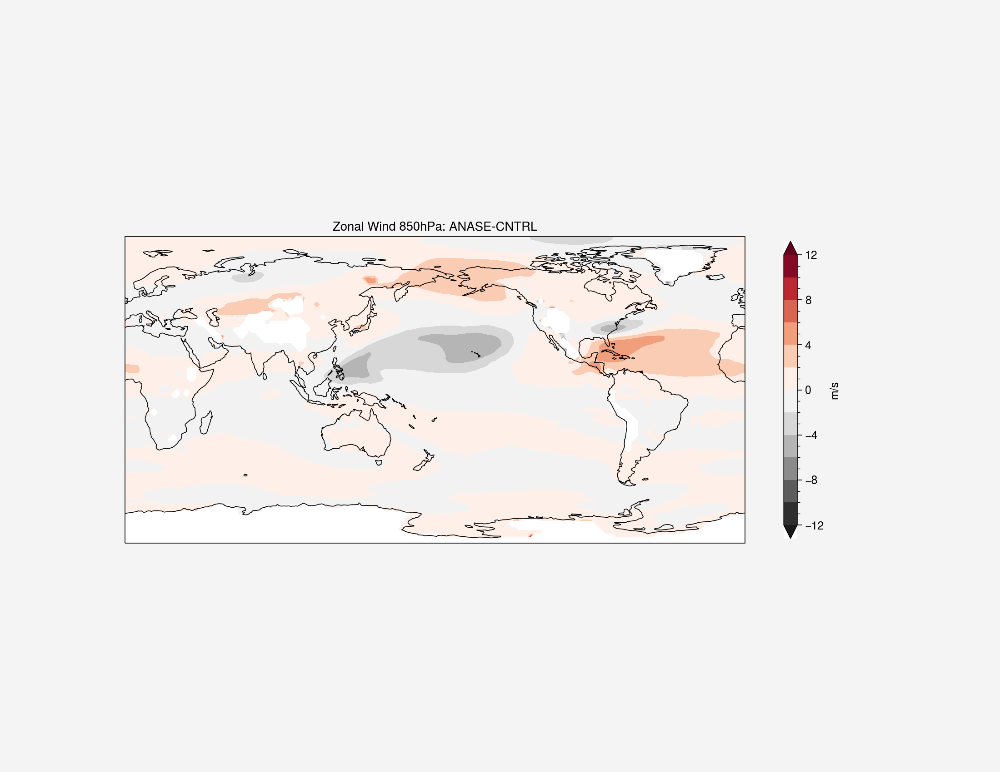

In [12]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['u'].sel(lev=850,exp='T63L26_CNTRLJJA').mean(dim='time')
data2=ds_exps['u'].sel(lev=850,exp='T63L26_ANASE').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-12,13,2))
ax.coastlines()
plt.title('Zonal Wind 850hPa: ANASE-CNTRL')
plt.colorbar(cs,shrink=0.5,label='m/s')

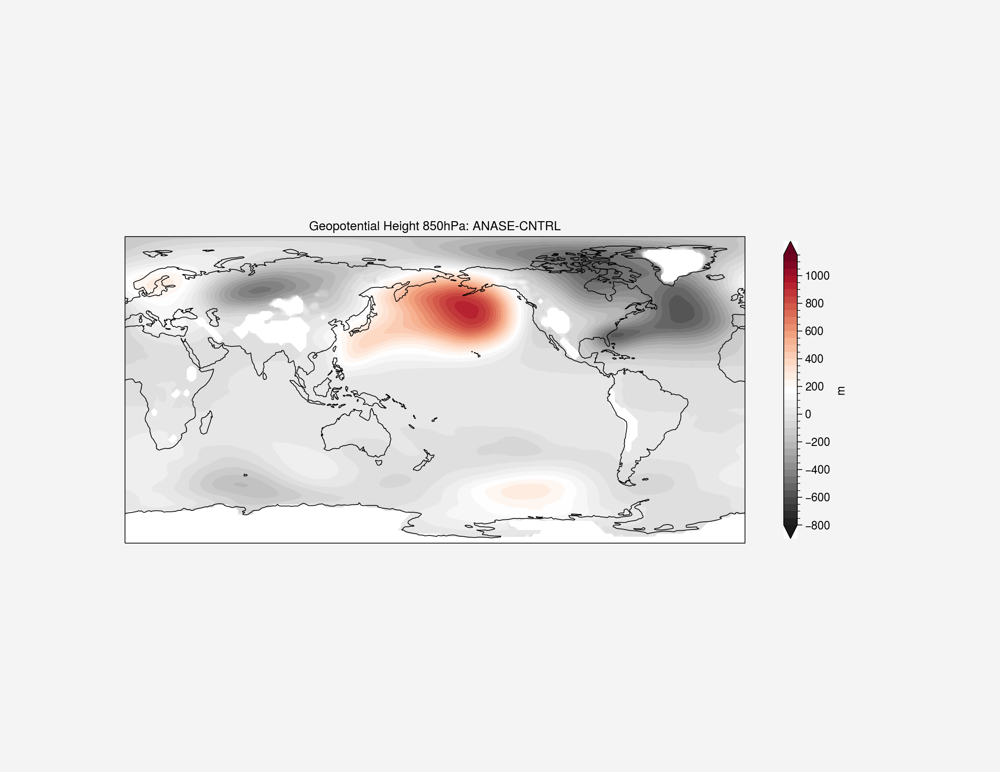

In [13]:
fig = plt.figure(figsize=(11.0,8.5))
ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
data1=ds_exps['geo'].sel(lev=850,exp='T63L26_CNTRLJJA').mean(dim='time')
data2=ds_exps['geo'].sel(lev=850,exp='T63L26_ANASE').mean(dim='time')
diff=data2-data1
cs=ax.contourf(diff['lon'], diff['lat'],diff,transform = ccrs.PlateCarree(),
               cmap='RdGy_r',extend='both',levels=np.arange(-800,1200,50))
ax.coastlines()
plt.title('Geopotential Height 850hPa: ANASE-CNTRL')
plt.colorbar(cs,shrink=0.5,label='m')

In [14]:
ftemp='/data/esplab/psinghai/projects/obs_seus/Review/wr_zcombined/Pos_prec_clusters.nc'
Dprec = xr.open_dataset(ftemp,autoclose=True)
Dprec

<xarray.Dataset>
Dimensions:    (clusters: 3608, lat: 281, lon: 1440)
Coordinates:
  * lat        (lat) float32 0.0 0.25 0.5 0.75 1.0 ... 69.25 69.5 69.75 70.0
  * clusters   (clusters) int32 2 2 2 1 1 1 1 1 1 1 1 ... 0 0 2 2 2 2 2 2 3 3 0
  * lon        (lon) float32 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
    dayofyear  (clusters) int64 ...
Data variables:
    prec       (clusters, lat, lon) float32 ...

In [15]:
prec_clusters=Dprec.groupby('clusters').mean().compute()

In [16]:
rain_anom=prec_clusters['prec'].sel(clusters=1)*10
rain_anom2=prec_clusters['prec'].sel(clusters=3)*10

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/tmp/ipykernel_1045578/2311948603.py:8: ProplotWarning: rc setting 'abc.style' was renamed to 'abc' in version 0.8.
  axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)
/tmp/ipykernel_1045578/2311948603.py:8: ProplotWarning: rc setting 'abc.style' was renamed to 'abc' in version 0.8.
  axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)
/tmp/ipykernel_1045578/2311948603.py:8: ProplotWarning: rc setting 'abc.style' was

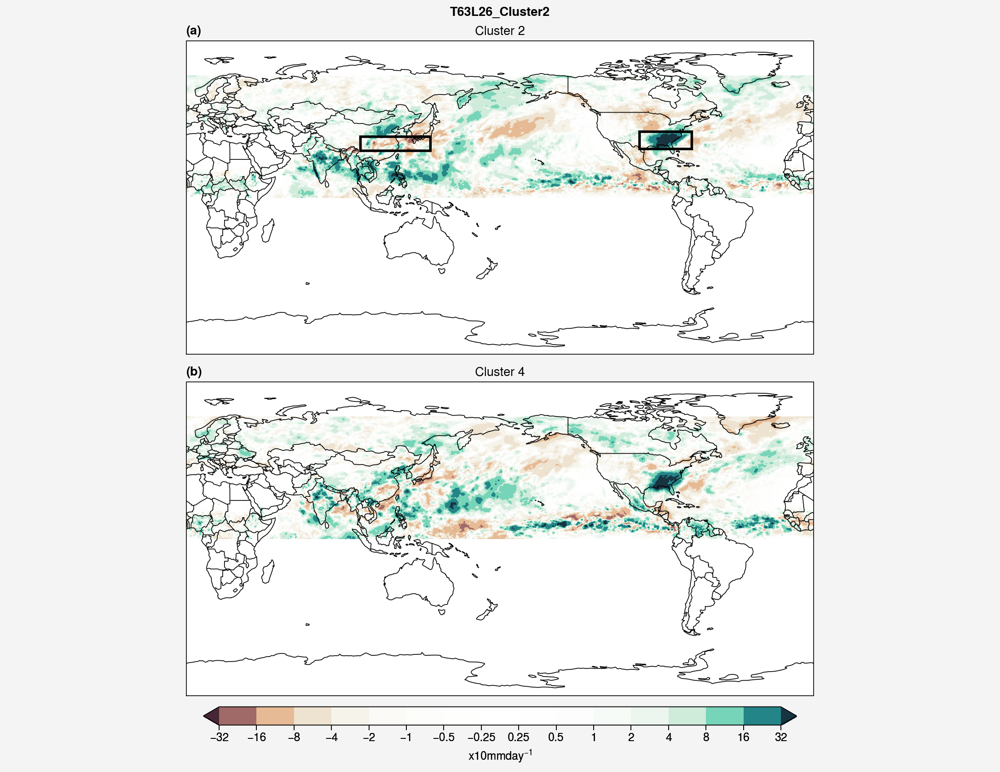

In [17]:
import matplotlib.patches as patches
nrows=2
ncols=1
clevs=[-32,-16,-8,-4,-2,-1,-0.5,-0.25,0.25,0.5,1,2,4,8,16,32]
cmap='DryWet'
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='pcarree',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)


# ANA
lon_min, lon_max = 100-180,140-180
lat_min, lat_max = 27,35
ana_rect = patches.Rectangle(
    (lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,
    edgecolor='black', facecolor='none', linewidth=2)

# ANAshifted
#lon_min, lon_max = 90-180,120-180
#lat_min, lat_max = 35,45
#anashifted_rect = patches.Rectangle(
#    (lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,
#    edgecolor='black', facecolor='none', linewidth=2)

# SE
lon_min, lon_max = 260-180,290-180
lat_min, lat_max = 28,38
se_rect = patches.Rectangle(
    (lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,
    edgecolor='black', facecolor='none', linewidth=2)

cs1=axs[0,0].contourf(rain_anom['lon'].values,rain_anom['lat'].values,
                             rain_anom.values,norm='div',levels=clevs,
                             cmap=cmap,extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,0].add_patch(ana_rect)
#axs[0,0].add_patch(anashifted_rect)
axs[0,0].add_patch(se_rect)
axs[0,0].format(title='Cluster 2',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


cs2=axs[1,0].contourf(rain_anom2['lon'].values,rain_anom2['lat'].values,
                             rain_anom2.values,norm='div',levels=clevs,
                             cmap=cmap,extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].format(title='Cluster 4',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)

f.colorbar(cs1,loc='b',length=0.6,label=r"$x10mmday^{-1}$")

#f.savefig(fname)

In [18]:
expnames=['T63L26_CNTRLJJA','T63L26_Cluster2','T63L26_ANA','T63L26_ANASE','T63L26_SE']
basepath='/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/'
DataSetname = ['uvel','vvel','geo']
Dataname = ['u','v','geo']

In [19]:
vname='u'
plev=200
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

exp_cntrl=ds_exps[vname].sel(lev=plev,exp='T63L26_CNTRLJJA')[0:60,:,:].mean(dim='time')
exp_cluster2=ds_exps[vname].sel(lev=plev,exp='T63L26_Cluster2')[0:60,:,:].mean(dim='time')
exp_ana=ds_exps[vname].sel(lev=plev,exp='T63L26_ANA')[0:60,:,:].mean(dim='time')
exp_anashifted=ds_exps[vname].sel(lev=plev,exp='T63L26_ANASE')[0:60,:,:].mean(dim='time')
exp_se=ds_exps[vname].sel(lev=plev,exp='T63L26_SE')[0:60,:,:].mean(dim='time')

diff_cluster2=(exp_cluster2-exp_cntrl) 
diff_ana=(exp_ana-exp_cntrl) 
diff_anashifted=(exp_anashifted-exp_cntrl) 
diff_se=(exp_se-exp_cntrl) 

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is depreca

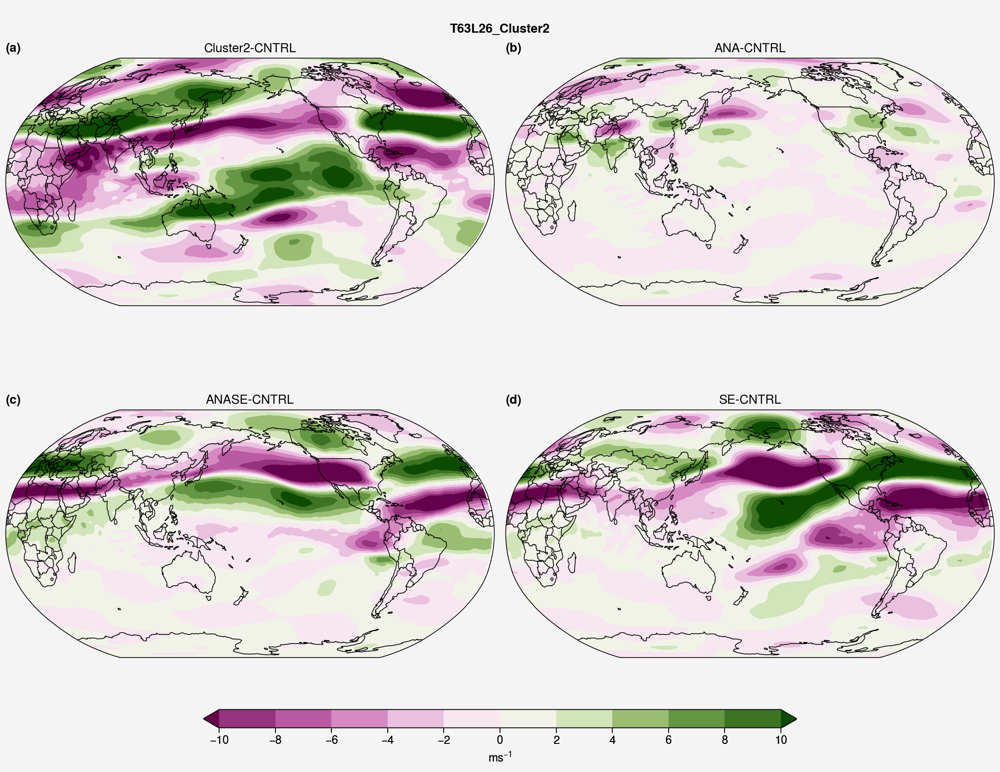

In [20]:
nrows=2
ncols=2
clevs=np.arange(-10,11,2)
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='robin',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)



cs1=axs[0,0].contourf(diff_cluster2['lon'].values,diff_cluster2['lat'].values,
                             diff_cluster2.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,1].contourf(diff_ana['lon'].values,diff_ana['lat'].values,
                             diff_ana.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].contourf(diff_anashifted['lon'].values,diff_anashifted['lat'].values,
                             diff_anashifted.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,1].contourf(diff_se['lon'].values,diff_se['lat'].values,
                             diff_se.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})

axs[0,0].format(title='Cluster2-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[0,1].format(title='ANA-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,0].format(title='ANASE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,1].format(title='SE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


f.colorbar(cs1,loc='b',length=0.6,label=r"$m{s^{-1}}$")


#f.savefig(fname)

In [21]:
vname='geo'
plev=850
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

exp_cntrl=ds_exps[vname].sel(lev=plev,exp='T63L26_CNTRLJJA').mean(dim='time')
exp_cluster2=ds_exps[vname].sel(lev=plev,exp='T63L26_Cluster2').mean(dim='time')
exp_ana=ds_exps[vname].sel(lev=plev,exp='T63L26_ANA').mean(dim='time')
exp_anashifted=ds_exps[vname].sel(lev=plev,exp='T63L26_ANASE').mean(dim='time')
exp_se=ds_exps[vname].sel(lev=plev,exp='T63L26_SE').mean(dim='time')

diff_cluster2=(exp_cluster2-exp_cntrl) 
diff_ana=(exp_ana-exp_cntrl) 
diff_anashifted=(exp_anashifted-exp_cntrl) 
diff_se=(exp_se-exp_cntrl) 

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is depreca

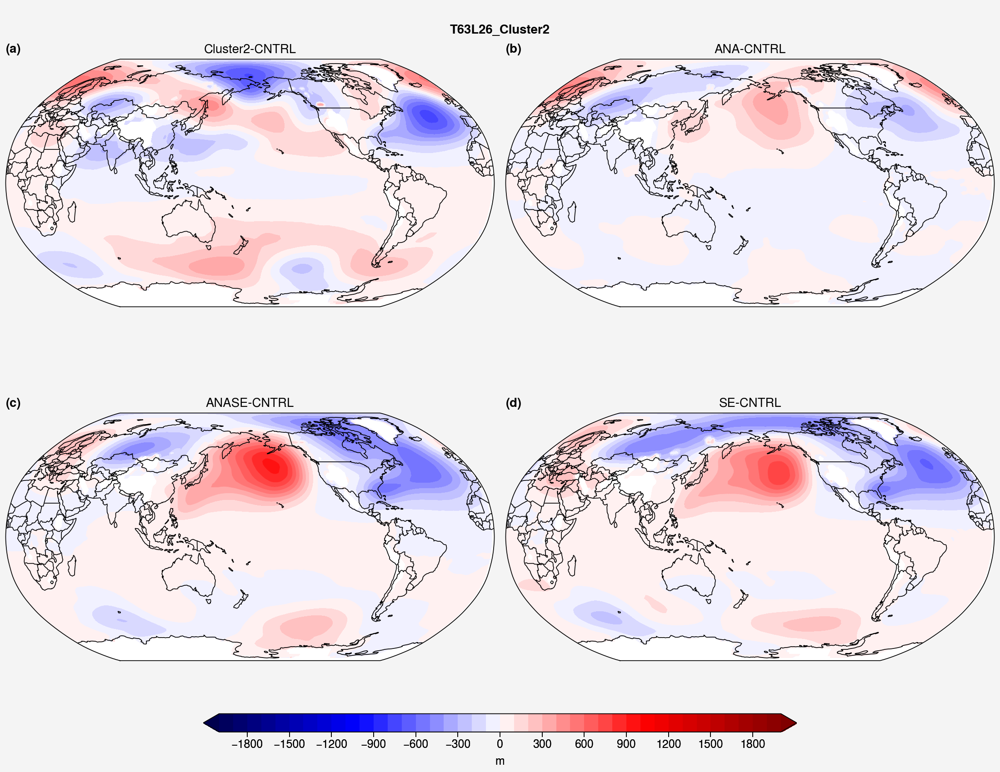

In [22]:
nrows=2
ncols=2
clevs=np.arange(-2000,2001,100)
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='robin',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)



cs1=axs[0,0].contourf(diff_cluster2['lon'].values,diff_cluster2['lat'].values,
                             diff_cluster2.values,norm='div',levels=clevs,
                             cmap='seismic',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,1].contourf(diff_ana['lon'].values,diff_ana['lat'].values,
                             diff_ana.values,norm='div',levels=clevs,
                             cmap='seismic',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].contourf(diff_anashifted['lon'].values,diff_anashifted['lat'].values,
                             diff_anashifted.values,norm='div',levels=clevs,
                             cmap='seismic',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,1].contourf(diff_se['lon'].values,diff_se['lat'].values,
                             diff_se.values,norm='div',levels=clevs,
                             cmap='seismic',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})

axs[0,0].format(title='Cluster2-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[0,1].format(title='ANA-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,0].format(title='ANASE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,1].format(title='SE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


f.colorbar(cs1,loc='b',length=0.6,label="m")


#f.savefig(fname)

In [23]:
vname='u'
plev=850
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

exp_cntrl=ds_exps[vname].sel(lev=plev,exp='T63L26_CNTRLJJA').mean(dim='time')
exp_cluster2=ds_exps[vname].sel(lev=plev,exp='T63L26_Cluster2').mean(dim='time')
exp_ana=ds_exps[vname].sel(lev=plev,exp='T63L26_ANA').mean(dim='time')
exp_anashifted=ds_exps[vname].sel(lev=plev,exp='T63L26_ANASE').mean(dim='time')
exp_se=ds_exps[vname].sel(lev=plev,exp='T63L26_SE').mean(dim='time')

diff_cluster2=(exp_cluster2-exp_cntrl) 
diff_ana=(exp_ana-exp_cntrl) 
diff_anashifted=(exp_anashifted-exp_cntrl) 
diff_se=(exp_se-exp_cntrl) 

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is depreca

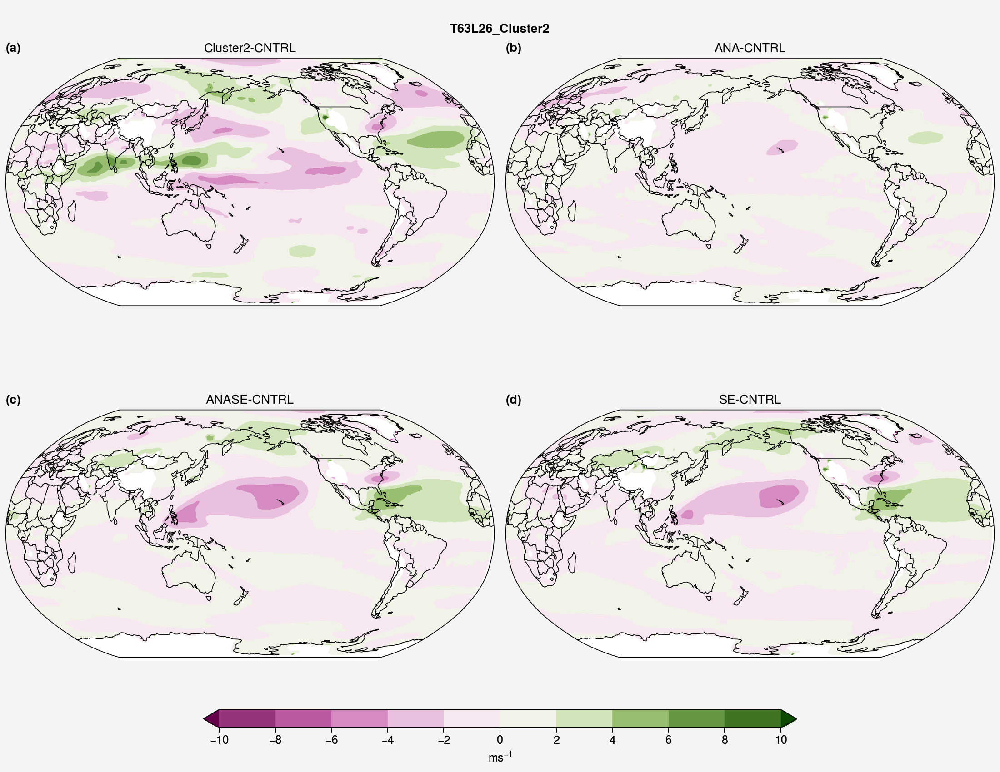

In [24]:
nrows=2
ncols=2
clevs=np.arange(-10,11,2)
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='robin',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)



cs1=axs[0,0].contourf(diff_cluster2['lon'].values,diff_cluster2['lat'].values,
                             diff_cluster2.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,1].contourf(diff_ana['lon'].values,diff_ana['lat'].values,
                             diff_ana.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].contourf(diff_anashifted['lon'].values,diff_anashifted['lat'].values,
                             diff_anashifted.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,1].contourf(diff_se['lon'].values,diff_se['lat'].values,
                             diff_se.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})

axs[0,0].format(title='Cluster2-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[0,1].format(title='ANA-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,0].format(title='ANASE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,1].format(title='SE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


f.colorbar(cs1,loc='b',length=0.6,label=r"$m{s^{-1}}$")


#f.savefig(fname)

In [25]:
vname='v'
plev=850
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

exp_cntrl=ds_exps[vname].sel(lev=plev,exp='T63L26_CNTRLJJA')[100::,:,:].mean(dim='time')
exp_cluster2=ds_exps[vname].sel(lev=plev,exp='T63L26_Cluster2')[100::,:,:].mean(dim='time')
exp_ana=ds_exps[vname].sel(lev=plev,exp='T63L26_ANA').mean(dim='time')
exp_anashifted=ds_exps[vname].sel(lev=plev,exp='T63L26_ANASE').mean(dim='time')
exp_se=ds_exps[vname].sel(lev=plev,exp='T63L26_SE').mean(dim='time')

diff_cluster2=(exp_cluster2-exp_cntrl) 
diff_ana=(exp_ana-exp_cntrl) 
diff_anashifted=(exp_anashifted-exp_cntrl) 
diff_se=(exp_se-exp_cntrl) 

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is depreca

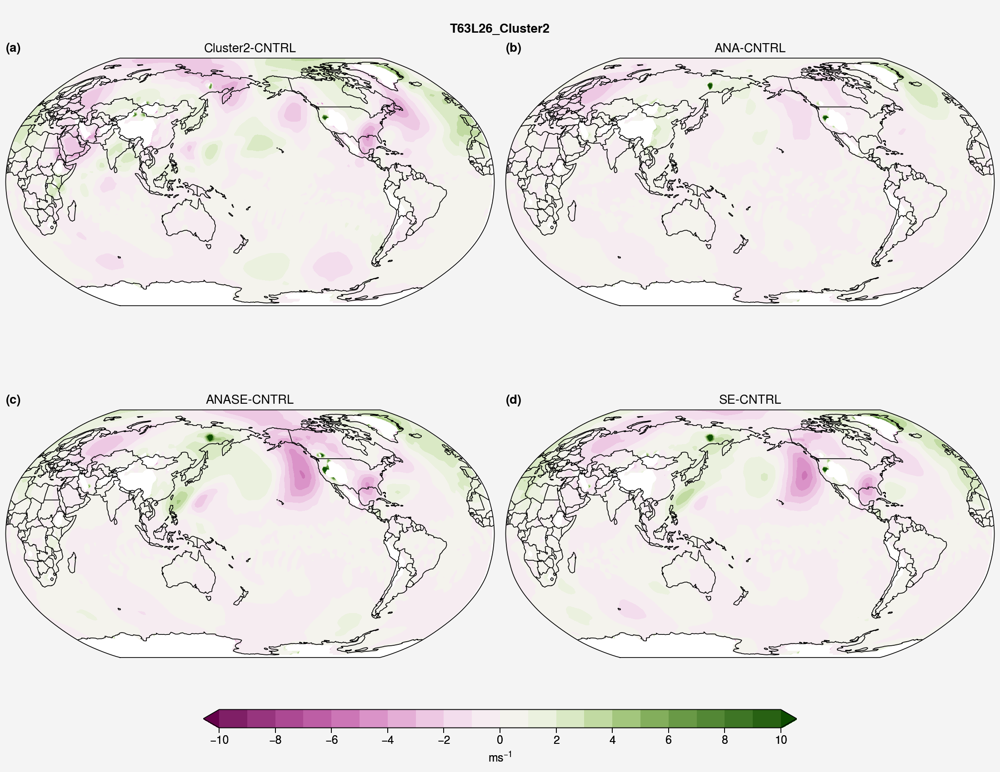

In [26]:
nrows=2
ncols=2
clevs=np.arange(-10,11,1)
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='robin',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)



cs1=axs[0,0].contourf(diff_cluster2['lon'].values,diff_cluster2['lat'].values,
                             diff_cluster2.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,1].contourf(diff_ana['lon'].values,diff_ana['lat'].values,
                             diff_ana.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].contourf(diff_anashifted['lon'].values,diff_anashifted['lat'].values,
                             diff_anashifted.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,1].contourf(diff_se['lon'].values,diff_se['lat'].values,
                             diff_se.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})

axs[0,0].format(title='Cluster2-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[0,1].format(title='ANA-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,0].format(title='ANASE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,1].format(title='SE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


f.colorbar(cs1,loc='b',length=0.6,label=r"$m{s^{-1}}$")


#f.savefig(fname)

In [27]:
vname='v'
plev=200
ds_exps_list=[]
for e in expnames:
    datapath=basepath+e+'/'
    ds_list=[]
    for dsn,dn in zip(DataSetname,Dataname):
        fnames=datapath+dsn+'_Pressure_*.nc'
        print(fnames)
        ds=xr.open_mfdataset(fnames,combine='by_coords')
        ds_list.append(ds)
    ds_all=xr.merge(ds_list)  
    ds_exps_list.append(ds_all)
ds_exps=xr.combine_nested(ds_exps_list,concat_dim='exp')
ds_exps['exp']=expnames

exp_cntrl=ds_exps[vname].sel(lev=plev,exp='T63L26_CNTRLJJA').mean(dim='time')
exp_cluster2=ds_exps[vname].sel(lev=plev,exp='T63L26_Cluster2').mean(dim='time')
exp_ana=ds_exps[vname].sel(lev=plev,exp='T63L26_ANA').mean(dim='time')
exp_anashifted=ds_exps[vname].sel(lev=plev,exp='T63L26_ANASE').mean(dim='time')
exp_se=ds_exps[vname].sel(lev=plev,exp='T63L26_SE').mean(dim='time')

diff_cluster2=(exp_cluster2-exp_cntrl) 
diff_ana=(exp_ana-exp_cntrl) 
diff_anashifted=(exp_anashifted-exp_cntrl) 
diff_se=(exp_se-exp_cntrl) 

/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_CNTRLJJA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_Cluster2/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/vvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANA/geo_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/T63L26_ANASE/uvel_Pressure_*.nc
/home/kpegion/projects/Atmospheric-Teleconnection-Model-main/

/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/kpegion/miniconda3/envs/subxnmme_clone/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is depreca

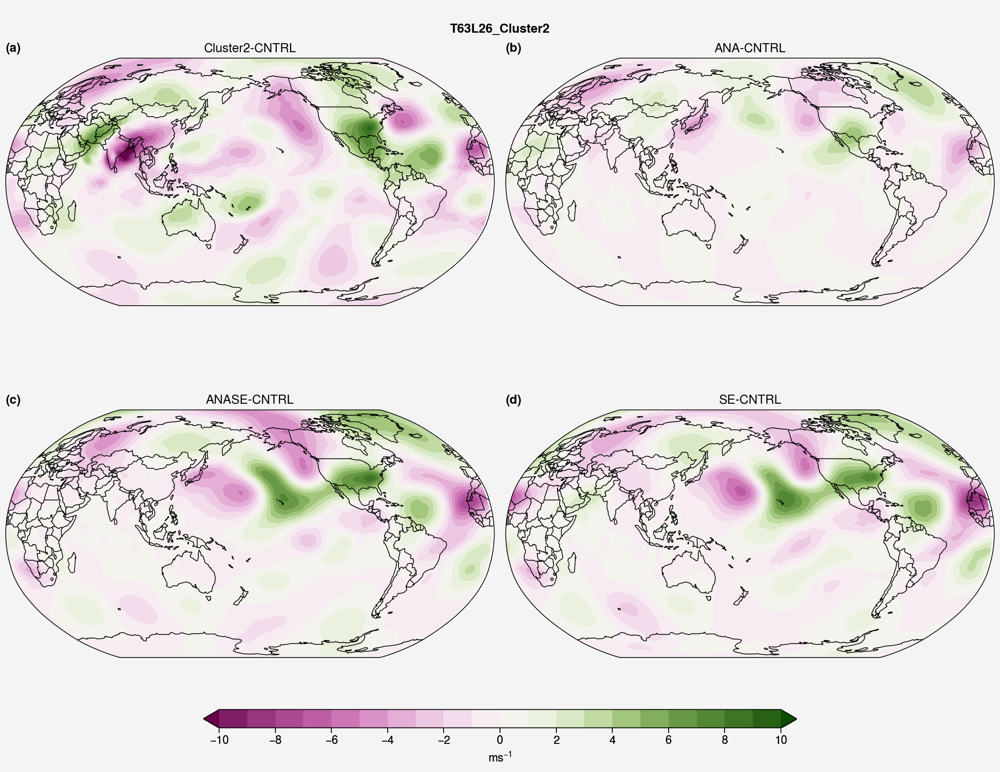

In [28]:
nrows=2
ncols=2
clevs=np.arange(-10,11,1)
f, axs = pplt.subplots(nrows=nrows,ncols=ncols,span=False,proj='robin',
                       proj_kw={'lon_0': 180},figsize=(11.0,8.5),sharex=False,sharey=False)
axs.format(abc=True, abcloc='l', abcstyle='(a)',suptitle=exp)



cs1=axs[0,0].contourf(diff_cluster2['lon'].values,diff_cluster2['lat'].values,
                             diff_cluster2.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[0,1].contourf(diff_ana['lon'].values,diff_ana['lat'].values,
                             diff_ana.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,0].contourf(diff_anashifted['lon'].values,diff_anashifted['lat'].values,
                             diff_anashifted.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})
axs[1,1].contourf(diff_se['lon'].values,diff_se['lat'].values,
                             diff_se.values,norm='div',levels=clevs,
                             cmap='bam',extend='both',labels=False,
                             labels_kw={'fontsize': 'large'})

axs[0,0].format(title='Cluster2-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[0,1].format(title='ANA-CNTRL',
                reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,0].format(title='ANASE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)
axs[1,1].format(title='SE-CNTRL',reso='lo', coastcolor='black', borderscolor='black',
                coast=True, innerborders=False, borders=True, grid=False)


f.colorbar(cs1,loc='b',length=0.6,label=r"$m{s^{-1}}$")


#f.savefig(fname)